# End to end multiclass dog breed classification

This notebook builds an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given the image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features

Some information about the data:
* We're dealing with images(unstructured data)
* There are 120 breeds of dogs
* There are around 10,000+ images in the training set
* There are around 10,000+ images in the test set

In [ ]:
#! unzip "/content/drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Vision"


### Get our workspace ready

* Import TensorFlow 2.0
* Import TensorFlow Hub
* Make sure we're using a GPU.


In [ ]:
# Import tensorflow into colab
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

#Check for GPU availability
print("GPU", "available (YESSSSS!!!)" if tf.config.list_physical_devices("GPU")else "not available :(")

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 73.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes

## Getting our data ready (turning it into tensors)
Lets start by accessing the data and checking out the labels.

In [2]:
# Checkout the labels of our data
import pandas as  pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

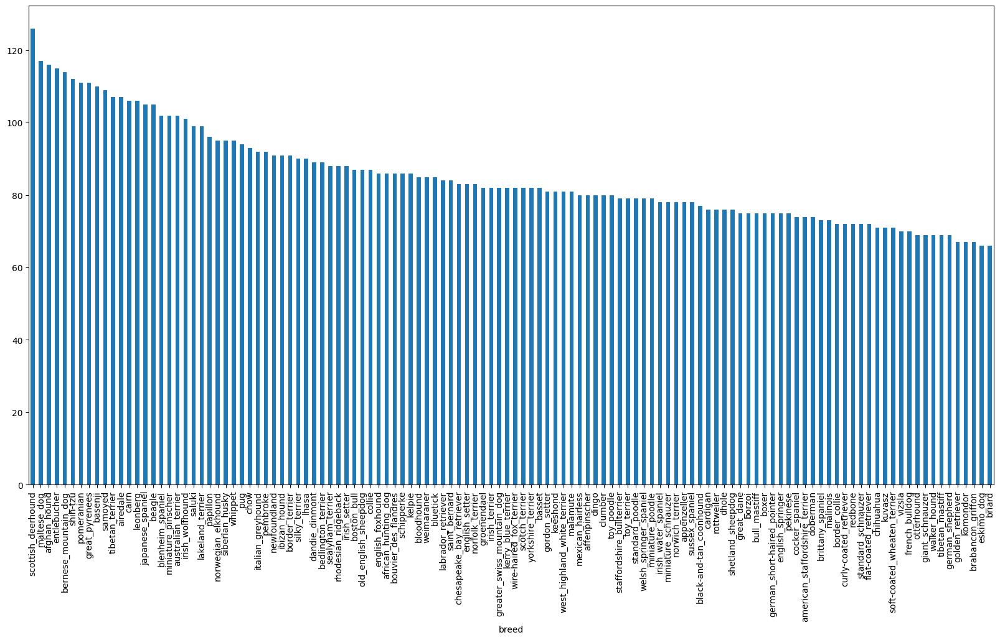

In [5]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

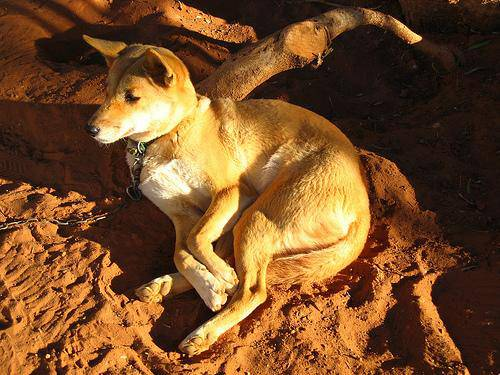

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [ ]:
# Create path names from image ids
filenames = ["drive/MyDrive/Dog-Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]


['drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether nuber of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-Vision/train")) == len(filenames):
  print("Filenames match actual amount of files")

Filenames match actual amount of files


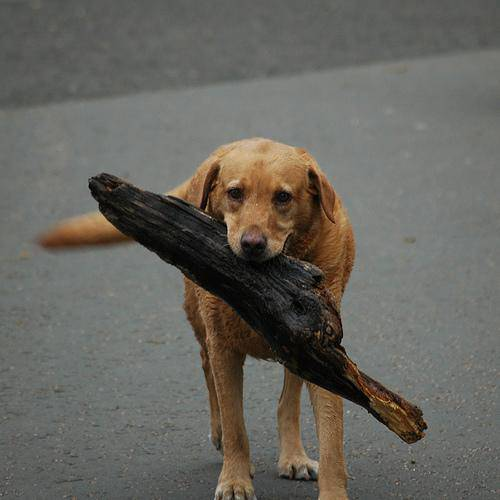

In [ ]:
# One more check
Image(filenames[4])

Since we've now got our training images filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels maatches the nummber of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
since the dataset from kaggle doesnt come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with around 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000 }

In [ ]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split
# Split them into training annd validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing images (turning images into tensors)

to preprocess our images into tensors we're going to write a function which does a few things:
1. take an image filepath as input
2. Use tensorflow to read the file and save it to a variable 'image'.
3. Turn our 'image' (a jpeg) into tensors
4. Normalize our image
5. resize the 'image' to be shape of (224,224)
6. Return the modified 'image'

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numeric tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go, they all might not fit into memory

so that's why we do about 32 (batch size) images at a time

in order to use tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
('image, label)'

In [ ]:
# Create a simple function to return a tuple
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we're got a way to turn our data into tuples of tensors in the form: (image,label)
let's make a function to turn all of our data(X & y) into batches!!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling after
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Let's check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

Our data is now in batches, however these can be a little hard to understand.


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25
  for i in range(25):
    #Create subplots (5rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

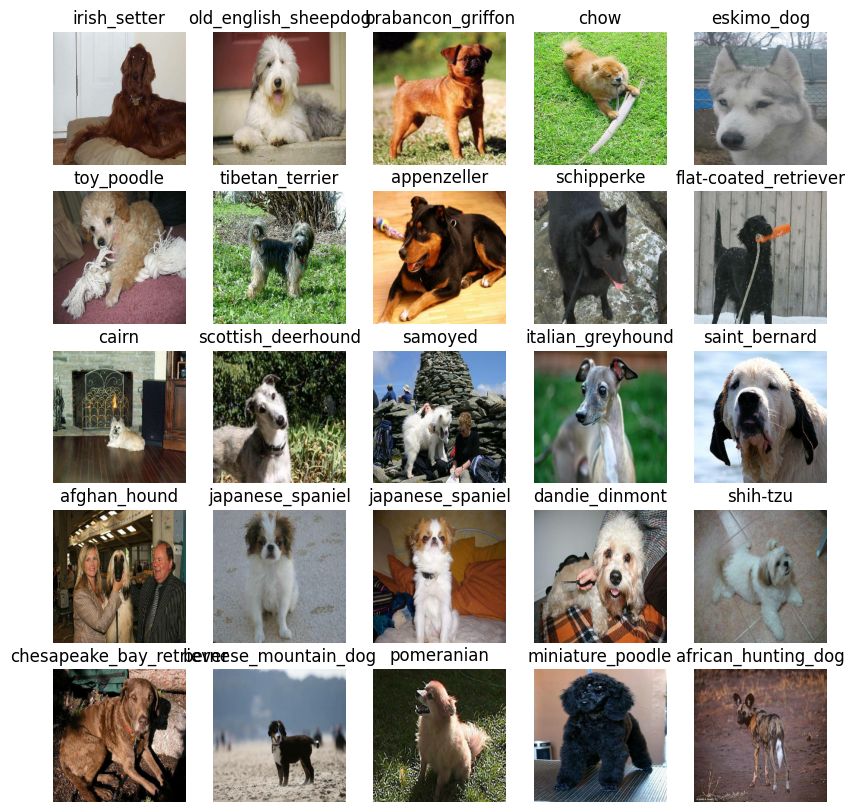

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

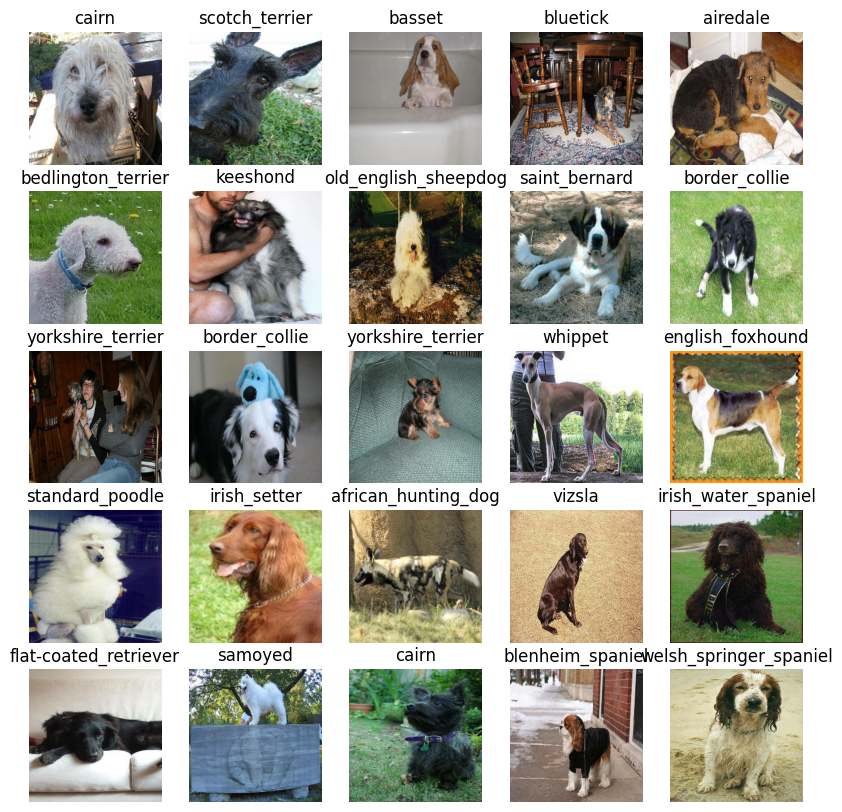

In [ ]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (image labels, in the form of tensors) to our model.
* The URL of the model we want to use

In [ ]:

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a keras deep learning model

Knowing this, let's create a function which:
* Takes the input shape, output shape and model we've chosen as parameters
* Defines the layers in a keras model in sequencial fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and imporved)
* Builds the model (tells the model the input shape it'll be getting)
* returns the model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL,), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

callbacks are helper funtions a model can use during training to do such things as save it's progress , check it's progress or stop training early if a model stops improving

We'll create 2 callbacks, one for tensorboard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

### TensorBoard callback

To setup a tensorboard callback, we need to do three things:
1. Load the tensorboard extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualize out models training logs with the %tensorboard magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/My Drive/Dog-Vision/logs",
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
early stopping helps stop out model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks we'de like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  model = create_model()

  # Create new tensorboard session everytime we train a a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 145s 4s/step - loss: 4.5935 - accuracy: 0.0975 - val_loss: 3.5550 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 1s 58ms/step - loss: 1.6478 - accuracy: 0.6662 - val_loss: 2.2994 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 1s 56ms/step - loss: 0.5703 - accuracy: 0.9525 - val_loss: 1.7500 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 2s 63ms/step - loss: 0.2553 - accuracy: 0.9837 - val_loss: 1.5735 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 2s 61ms/step - loss: 0.1483 - accuracy: 0.9962 - val_loss: 1.4715 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 1s 59ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 1.4188 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=====================

### Checking the tensorboard logs

The tensorboard magic function ('%tensorboard') will access the logs directory we created and visualize it's contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog-Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 41ms/step


array([[8.49781325e-04, 1.51043190e-04, 5.12825427e-05, ...,
        3.44638014e-04, 2.04561700e-04, 9.33401007e-03],
       [8.44517082e-04, 2.63260416e-04, 2.84272991e-03, ...,
        9.07467038e-04, 2.73949001e-03, 8.68878633e-05],
       [2.16791032e-05, 7.58152237e-05, 8.53354868e-06, ...,
        8.93346296e-05, 4.06203995e-04, 8.91331947e-05],
       ...,
       [5.20377725e-05, 6.51579103e-05, 2.80902663e-04, ...,
        1.22186175e-05, 4.44791425e-04, 3.21237982e-04],
       [2.42917542e-03, 2.74841441e-04, 1.09801294e-04, ...,
        5.87980758e-05, 1.52271823e-04, 1.53961023e-02],
       [4.23472375e-04, 4.19311291e-05, 1.56149431e-03, ...,
        4.31784755e-03, 1.44201319e-03, 1.84496617e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.77042558e-05 9.38859448e-05 1.14868242e-04 2.93398072e-04
 7.75070861e-03 2.87871051e-04 2.08991507e-04 8.80766951e-04
 6.76996633e-03 1.60903726e-02 8.52503490e-06 9.85461957e-05
 3.26133275e-04 2.89181387e-03 7.18103547e-04 6.22385507e-03
 1.50348787e-05 2.29546276e-04 6.16541147e-05 2.62900401e-04
 9.67810774e-05 7.64732598e-04 1.62291879e-04 1.96012057e-04
 1.90653615e-02 7.19857169e-04 2.95062200e-04 2.03791526e-04
 2.85116461e-04 1.11838206e-04 1.76064554e-04 1.63069446e-04
 3.58848592e-05 2.54311562e-05 7.55444489e-05 2.49288150e-05
 1.81017036e-04 4.52609675e-04 9.37975274e-05 1.98757246e-01
 1.59323405e-04 4.71272651e-05 6.51901262e-03 1.24796006e-05
 3.17942409e-04 3.64372063e-05 1.62938086e-04 8.48641619e-04
 8.45758332e-05 2.53370730e-04 4.12985355e-05 6.48104397e-05
 2.49316072e-04 9.26675450e-04 1.27280640e-04 1.59717107e-04
 1.77105961e-04 4.72766733e-05 2.19492096e-04 3.48742615e-05
 7.98921101e-05 9.14516044e-04 1.51544100e-06 6.77127609e-05
 2.95990525e-04 3.652464

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale

And it would be better if we could see the image the prediction was made on.

In [ ]:
# Turn predition probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset
we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

  # Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's make some function to make all these a bit more visualisable

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilites to a prediced label
* Plot the predicted label, it's predicted probability, the truth label and the target image in a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction was right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

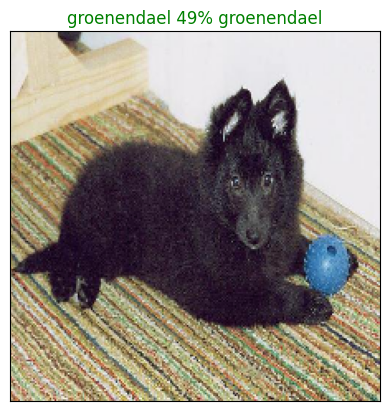

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model's top predictions.
Let's make another to make top 10 predictions

this function will:
* Take an input of prediction probabilties array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabailites indexes
  * Prediction probabilties values
  * Prediction labels
* Plot the top 10 prediction values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Fing the top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

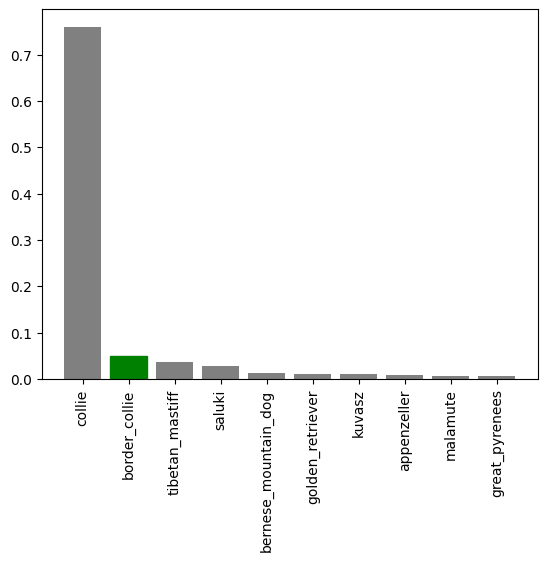

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualise some predictions and evaluate our model


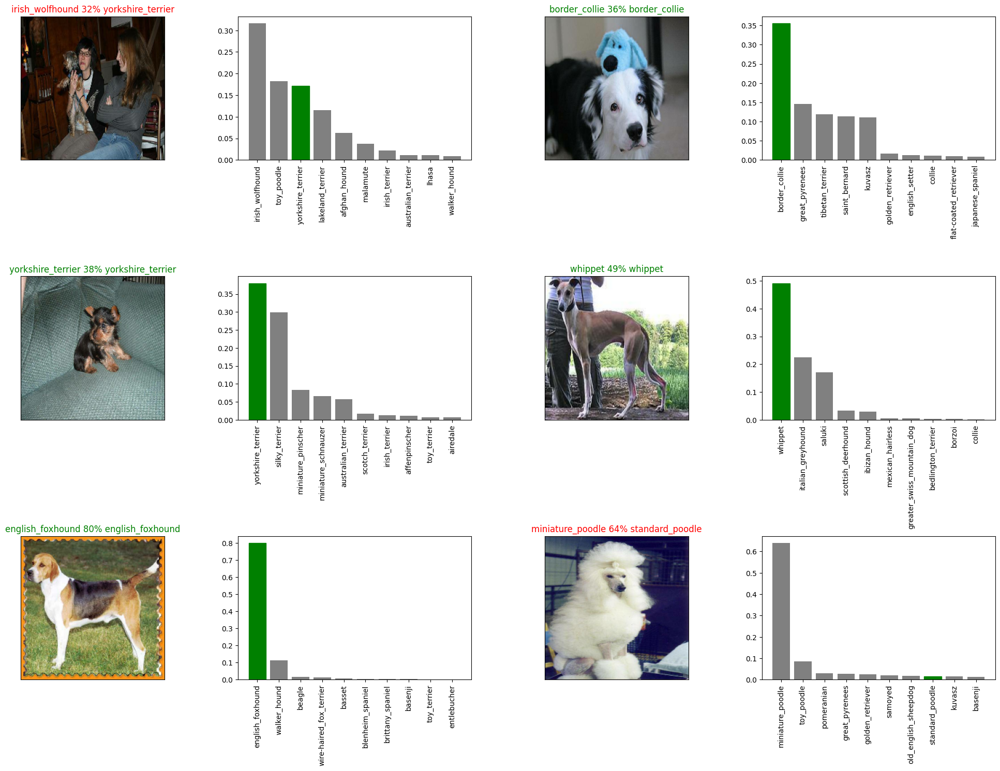

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a directory and appends a suffix(string)
  """
   # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog-Vision/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
    print(f"Loading saved model from {model_path}")
    # Register KerasLayer in the custom object scope
    with tf.keras.utils.custom_object_scope({'KerasLayer': hub.KerasLayer}):
        model = tf.keras.models.load_model(model_path)
    return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-Vision/models/20241013-19201728847247-1000-images-mobilenetv2-Adam.h5....


'drive/My Drive/Dog-Vision/models/20241013-19201728847247-1000-images-mobilenetv2-Adam.h5'

In [ ]:
 # Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog-Vision/models/20241013-16531728838400-1000-images-mobilenetv2-Adam.h5')

Loading saved model from drive/My Drive/Dog-Vision/models/20241013-16531728838400-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 0s 55ms/step - loss: 1.3077 - accuracy: 0.6550


[1.3077131509780884, 0.6549999713897705]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 40ms/step - loss: 1.2974 - accuracy: 0.6500


[1.297401785850525, 0.6499999761581421]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validaation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

**Note:** Running thr cell below will take a little because the GPU will have to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 19s 47ms/step - loss: 1.3298 - accuracy: 0.6724
Epoch 2/100
320/320 [==============================] - 14s 45ms/step - loss: 0.4036 - accuracy: 0.8773
Epoch 3/100
320/320 [==============================] - 14s 45ms/step - loss: 0.2360 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 15s 46ms/step - loss: 0.1525 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 15s 46ms/step - loss: 0.1069 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 14s 45ms/step - loss: 0.0749 - accuracy: 0.9872
Epoch 7/100
320/320 [==============================] - 14s 45ms/step - loss: 0.0587 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 15s 47ms/step - loss: 0.0469 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 16s 49ms/step - loss: 0.0376 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 15s 47ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog-Vision/models/20241013-19441728848689-full-image-set-mobilenetv2-Adam.h5....


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog-Vision/models/20241013-19441728848689-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/Dog-Vision/models/20241013-19441728848689-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from drive/My Drive/Dog-Vision/models/20241013-19441728848689-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we creates create_data_batches() which takes a list of filenames as input and convert them into Tensor batches

To make predictions on the test data we'll:

* Get the test image filenames
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to **True**
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog-Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog-Vision/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 'drive/My Drive/Dog-Vision/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 'drive/My Drive/Dog-Vision/test/e69416b277bf04ba83a5f3586fe12f9b.jpg',
 'drive/My Drive/Dog-Vision/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/My Drive/Dog-Vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 'drive/My Drive/Dog-Vision/test/e4ec1e1a3e21d31f6e058c04655cb38b.jpg',
 'drive/My Drive/Dog-Vision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/My Drive/Dog-Vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 'drive/My Drive/Dog-Vision/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 'drive/My Drive/Dog-Vision/test/e4c49d7e028965d3504b0862633464c3.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling predict() on our full model and passing it the test data batch will take a long time

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 193s 592ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog-Vision/preds_csv.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog-Vision/preds_csv.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.32124209e-10, 4.06188590e-11, 6.28338978e-11, ...,
        2.20316707e-07, 3.14524275e-11, 1.60244595e-10],
       [4.15663237e-09, 7.76079534e-10, 4.60258498e-10, ...,
        1.83911339e-08, 6.05121020e-09, 6.99510708e-13],
       [1.20898042e-10, 1.35922438e-08, 5.76489922e-09, ...,
        4.48458715e-10, 8.61347971e-09, 2.60887223e-09],
       ...,
       [1.08054887e-09, 4.55248117e-10, 2.93803620e-10, ...,
        1.60119839e-14, 2.06520196e-12, 1.04656072e-04],
       [2.38748275e-11, 2.25510478e-11, 5.92026471e-12, ...,
        4.88246986e-12, 4.07619945e-11, 9.76447456e-09],
       [1.95272820e-09, 6.03956274e-10, 3.39716926e-12, ...,
        9.83079517e-14, 1.02163278e-09, 6.53499086e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

To get the data in the format we'll:
* Create a pandas dataframe with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data to each of the dog breed columns
* Export the dataframe as a cSV to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['drive/My Drive/Dog-Vision/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 'drive/My Drive/Dog-Vision/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 'drive/My Drive/Dog-Vision/test/e69416b277bf04ba83a5f3586fe12f9b.jpg',
 'drive/My Drive/Dog-Vision/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/My Drive/Dog-Vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 'drive/My Drive/Dog-Vision/test/e4ec1e1a3e21d31f6e058c04655cb38b.jpg',
 'drive/My Drive/Dog-Vision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/My Drive/Dog-Vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 'drive/My Drive/Dog-Vision/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 'drive/My Drive/Dog-Vision/test/e4c49d7e028965d3504b0862633464c3.jpg',
 'drive/My Drive/Dog-Vision/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 'drive/My Drive/Dog-Vision/test/ee345e7f5ac2d3cf979a17183437faa7.jpg',
 'drive/My Drive/Dog-Vision/test/f0311d1414f9ce10cffda4c207c108dc.jpg',
 'drive/My Drive/Dog-Vision/test/e995cbf5f2c4da27a1e56966c70de38

In [ ]:
# Append test image ID's to predictions data frame
test_ids = [os.path.splitext(path) [0] for path in os.listdir(test_path)]
test_ids

['e200fe397f6ca5d626210830fc38aca9',
 'e4f8465214c9644b10c536ecb087b7be',
 'e69416b277bf04ba83a5f3586fe12f9b',
 'deb66780609abfef7f5048df02149839',
 'e421e13d0d4c977ab89fa9965221809c',
 'e4ec1e1a3e21d31f6e058c04655cb38b',
 'df8d6d05e6f83c513a4ab0077207a72a',
 'e293d06016cac647cd289e2008a4623a',
 'e1d31decdd6521df89e59d181f0c73ed',
 'e4c49d7e028965d3504b0862633464c3',
 'e05367db91d0449b2afe76a1b7acc1c8',
 'ee345e7f5ac2d3cf979a17183437faa7',
 'f0311d1414f9ce10cffda4c207c108dc',
 'e995cbf5f2c4da27a1e56966c70de380',
 'eb8e9637c329ca7ad7937be0ec94e80d',
 'f1f339f43e83cfb8e4bf76ff5671489c',
 'e995cac3e30ce4e55d0f203c20cd0986',
 'f2b7d11ea6ccf65f214cac2abee8d1a1',
 'f46c9b6ddea9aa7ff685604eec44f67a',
 'ee588777db43361c045c5dd7a779ed0f',
 'ed8e5c431d6539db02614ddc1f35ce10',
 'e8d5c81029e17c81b06af60ec4113b30',
 'ec6b4aee97cf7eeb6cb26540af933db2',
 'ef58b740df67a98d390f5bf8513bcea5',
 'f3df185234b2be78825de1ba63d6c554',
 'ecca3983aa3cf5699ce3aa29c7899df8',
 'e85b19a69be67eaef9fe58b7e689ee81',
 

In [ ]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e200fe397f6ca5d626210830fc38aca9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4f8465214c9644b10c536ecb087b7be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e69416b277bf04ba83a5f3586fe12f9b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,deb66780609abfef7f5048df02149839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e421e13d0d4c977ab89fa9965221809c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e200fe397f6ca5d626210830fc38aca9,2.321242e-10,4.061886e-11,6.283390e-11,4.035873e-09,4.543805e-08,4.506960e-03,2.442540e-09,3.978279e-08,1.790662e-05,...,1.202153e-08,1.535559e-10,2.515132e-10,2.475140e-08,5.573401e-12,1.786380e-09,2.539436e-10,2.203167e-07,3.145243e-11,1.602446e-10
1,e4f8465214c9644b10c536ecb087b7be,4.156632e-09,7.760795e-10,4.602585e-10,1.656099e-07,3.238606e-11,5.020222e-08,1.562446e-13,5.331452e-13,6.219047e-14,...,3.025609e-13,9.882734e-11,2.474401e-12,7.763509e-09,7.951819e-08,1.643783e-11,1.634939e-12,1.839113e-08,6.051210e-09,6.995107e-13
2,e69416b277bf04ba83a5f3586fe12f9b,1.208980e-10,1.359224e-08,5.764899e-09,2.301336e-11,3.300793e-09,3.576052e-10,2.177405e-09,1.644182e-06,2.681428e-09,...,5.337128e-11,1.463247e-08,8.487723e-09,8.258726e-11,8.511883e-08,4.415513e-11,5.474755e-10,4.484587e-10,8.613480e-09,2.608872e-09
3,deb66780609abfef7f5048df02149839,4.839676e-09,1.228170e-05,5.183604e-10,4.257520e-10,1.842761e-07,3.613559e-10,2.265155e-09,3.168722e-10,2.225829e-10,...,2.597566e-05,9.087453e-09,2.369712e-06,6.116256e-07,1.260846e-05,1.226584e-04,1.075025e-05,2.840566e-05,6.727180e-06,6.767719e-08
4,e421e13d0d4c977ab89fa9965221809c,3.896387e-14,3.715094e-11,1.450609e-08,8.486284e-12,3.895932e-11,1.293052e-10,3.479182e-10,2.208643e-08,1.124046e-07,...,8.030332e-08,6.887924e-09,4.110522e-12,2.217618e-11,1.454921e-10,2.453156e-09,7.337508e-11,3.162502e-09,2.412504e-09,1.092187e-13


In [ ]:
preds_df.to_csv("drive/My Drive/Dog-Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(), and since our custom images won't have labels, we set the test_data parameter to 'True
* Pass the custom image data batch to our model's predict() method.
* convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-Vision/my-dog-photos"
custom_image_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/MyDrive/Dog-Vision/my-dog-photos/pexels-creative-vix-7288.jpg',
 'drive/MyDrive/Dog-Vision/my-dog-photos/pexels-summerstock-333083.jpg',
 'drive/MyDrive/Dog-Vision/my-dog-photos/pexels-wildlittlethingsphoto-2253275.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 377ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_label = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_label

['beagle', 'german_shepherd', 'golden_retriever']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

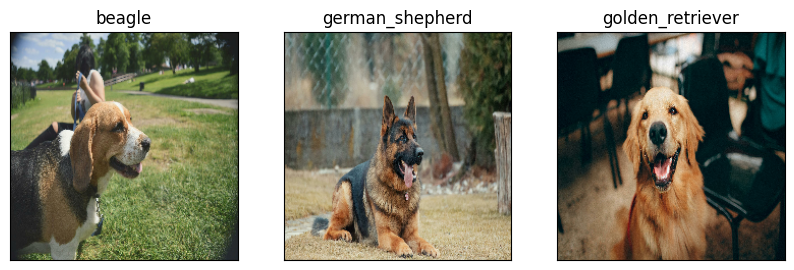

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_label[i])
  plt.imshow(image)